In [ ]:
# Importation des packages nécessaires 
import pandas as pd 
import numpy as np
import seaborn as sns 
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import Pipeline
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import joblib


# Analyse exploratoire des données

## Importation et visualisation de la base de données

In [2]:
nig = pd.read_csv("NigeriaTRAIN.csv", sep = ";")  
nig.head()

,Customer ID,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2,Churn Status
0,ADF0039,123,4.10,76.7140,0.00,1.25,1.4951,14,564,6408,2,2G,2G,Uxaa,Mango,0
1,ADF0041,1316,43.87,98.8904,4.14,1.25,1.0244,27,1626,4373,1,2G,2G,Uxaa,Mango,0
2,ADF0051,2385,79.50,372.6300,3.51,1.25,6.0898,119,10411,22039,1,2G,2G,Weematel,Mango,0
3,ADF0059,1614,53.80,530.2000,6.85,1.25,3.3447,69,6822,6274,1,2G,2G,0,Mango,0
4,ADF0060,2175,72.50,554.1300,6.99,153.75,673204.0342,33,3387,7241,1,2G,3G,Weematel,Mango,0


**Explication des variables**

Dépenses totales aux mois 1 et 2 de 2017 (var4): Dépenses totales d'un client durant les mois de juillet et août 2017.

Dépenses totales en SMS (var5): Montant total dépensé en SMS par un client, correspondant aux revenus générés par l'utilisation du service SMS.

Dépenses totales en données (var6): Montant total dépensé en données/Internet par un client, correspondant aux revenus générés par l'utilisation du service Internet.

Consommation totale de données (var7): Volume total de données consommées par un abonné, exprimé en kilo-octets (KB), sur la période étudiée.

Nombre total d'appels uniques (var8): Nombre total d'appels uniques passés par un abonné durant la période étudiée.

Dépenses totales en appels on-net (var9): Montant total dépensé par un client pour effectuer des appels au sein du même réseau (appels vers des abonnés du même opérateur).

Dépenses totales en appels off-net (var10): Montant total dépensé par un client pour effectuer des appels vers d'autres réseaux (appels vers des abonnés d'un autre opérateur).

Ancienneté du client en mois (var3customer tenure in month) : Durée écoulée depuis que l'abonné a commencé à utiliser les services de l'opérateur, exprimée en mois.

Type de réseau souscrit au mois 1 : Indique le type de réseau préféré par le client, pouvant refléter son type d'appareil (service 2G ou 3G).

Type de réseau souscrit au mois 2 : Indique le type de réseau préféré par le client un mois plus tard, pouvant refléter son type d'appareil (service 2G ou 3G).

Nombre total de réclamations au service client : Nombre de réclamations effectuées par l'abonné auprès du service client.

Réseau concurrent préféré au mois 1 : Indique l'opérateur concurrent que le client préfère, ce qui peut donner une indication sur l'opérateur vers lequel il pourrait migrer.

Réseau concurrent préféré au mois 2 : Indique l'opérateur concurrent que le client préfère un mois plus tard, ce qui peut donner une indication sur l'opérateur vers lequel il pourrait migrer.

Statut de churn (désabonnement) : Indicateur permettant de savoir si un client quitte le réseau ou non. 1 signifie que le client s'est désabonné (churn), tandis que 0 signifie qu'il est resté abonné.

## Exploration générale

In [ ]:
# Statistiques sommaires sur les variables numériques.
nig.describe()

,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Churn Status
count,1400.000000,1400.000000,1400.000000,1400.000000,1400.000000,1.400000e+03,1400.000000,1400.000000,1400.00000,1400.000000,1400.000000
mean,1450.634286,48.354479,805.641729,30.394286,58.482293,2.162307e+06,202.422143,6814.392143,15730.42000,1.922143,0.500000
std,1276.008188,42.533536,1251.742068,60.885095,289.613589,6.865958e+06,302.036220,16707.784943,37448.94212,2.345515,0.500179
min,-5.000000,-0.170000,4.910000,0.000000,0.000000,5.860000e-02,1.000000,0.000000,0.00000,1.000000,0.000000
25%,287.000000,9.567500,155.537500,2.620000,1.250000,1.384346e+03,18.000000,60.000000,1123.00000,1.000000,0.000000
50%,1171.000000,39.030000,606.575000,13.715000,11.250000,1.193487e+05,81.500000,1617.000000,4171.00000,1.000000,0.500000
75%,2242.000000,74.732500,1018.395500,31.205000,42.812500,1.206785e+06,254.250000,7177.750000,13151.50000,2.000000,1.000000
max,5451.000000,181.700000,24438.830000,873.980000,8295.000000,9.945640e+07,2596.000000,381174.000000,431440.00000,49.000000,1.000000


- network_age (et donc Customer tenure in month) ont des valeurs négatives ce qui est anormal. 
- On note de de grandes étendues (max-min) et de grands écarts-types entre les données en ce qui concerne les variables numériques. 

Cela laisse presager la présence qe valeurs aberrantes. 

Nous approfondissons l'exploration avec _ProfileReport_ du package ydata_profiling. 

In [2]:
from ydata_profiling import ProfileReport

# Générer le rapport
report = ProfileReport(nig, explorative=True)

# Afficher dans le notebook
report.to_notebook_iframe()



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 16/16 [00:00<00:00, 55.50it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Le dataset comporte **5 variables catégorielles, 10 variables numériques** et une variable textuelle (les id des consommateurs). Il comporte par ailleurs **1400 observations**.

Nous notons **321 valeurs manquantes** soit 1,4% du total.

Anomalies relevées : 

- **network_age** comporte  3 valeurs négatives. **Customer tenure in month** est donc également affecté (car  Customer tenure in month = Networkage /30) ;
- **Total SMS spend** comporte beaucoup de zéros mais cela est plausible ;  
- **Network type subscription in Month 1** et **Network type subscription in Month 2** comportent beaucoup de valeurs manquantes (175 et 144 respectivement) ;
- **Most Loved Competitor network in in Month 1** et **Most Loved Competitor network in in Month 2**  comportent une valeur manquante chacun. 

Nous notons en outre une forte corrélation entre variables Network type subscription in Month 1 et Network type subscription in Month 2 ainsi que Most Loved Competitor network in in Month 1 et Most Loved Competitor network in in Month 2. Celle entre network_age et Customer tenure in month est tout à fait normale.  

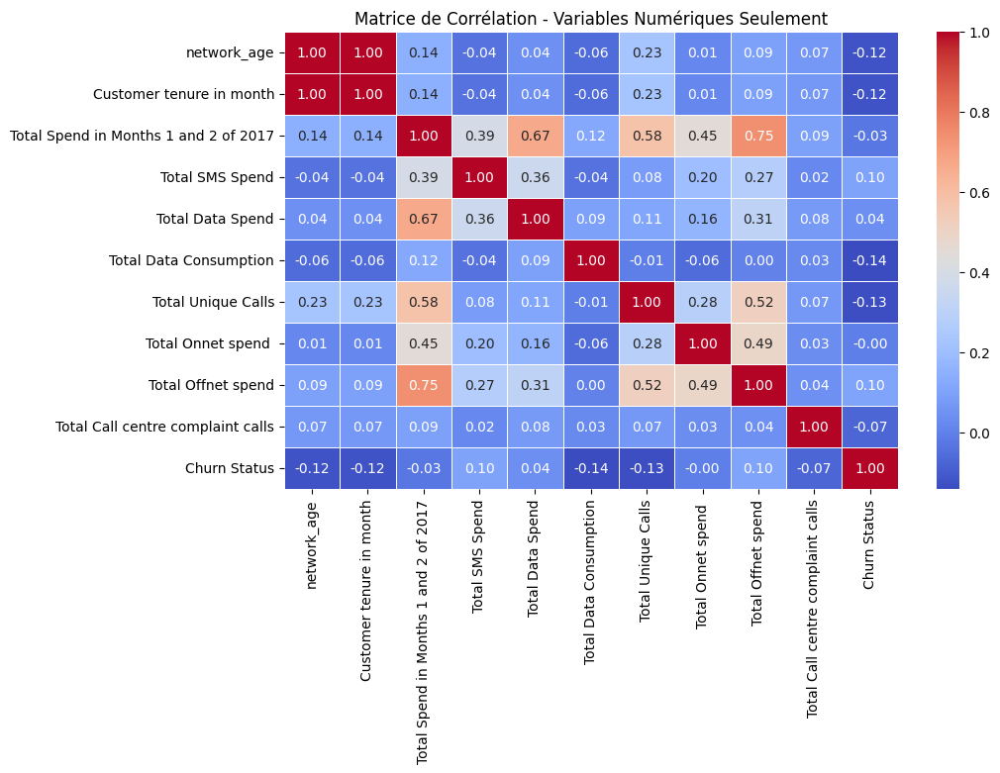

In [ ]:
# Sélectionner uniquement les colonnes numériques
nig_quanti = nig.select_dtypes(include=['number'])

# Calcul de la matrice de corrélation
corr_matrix = nig_quanti.corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matrice de Corrélation des valeurs numériques")
plt.show()

In [44]:
import scipy.stats as stats

# Sélectionner uniquement les variables qualitatives
qualitative_vars = nig.select_dtypes(include=['object', 'category'])

# Initialiser un DataFrame vide pour stocker les p-values
chi2_matrix = pd.DataFrame(index=qualitative_vars.columns, columns=qualitative_vars.columns)

# Boucle pour calculer le Khi-deux entre chaque paire de variables
for var1 in qualitative_vars.columns:
    for var2 in qualitative_vars.columns:
        if var1 != var2:  # On évite de tester une variable avec elle-même
            contingency_table = pd.crosstab(qualitative_vars[var1], qualitative_vars[var2])  # Table de contingence
            chi2, p, _, _ = stats.chi2_contingency(contingency_table)  # Test Khi-Deux
            chi2_matrix.loc[var1, var2] = round(p, 4)  # Stocker la p-value
        else:
            chi2_matrix.loc[var1, var2] = "-"  # Pas de test avec la même variable

# Afficher le tableau
print("Matrice des p-values du test Khi-Deux :")
chi2_matrix


Matrice des p-values du test Khi-Deux :


,Customer ID,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2
Customer ID,-,0.4848,0.485,0.4795,0.4809
Network type subscription in Month 1,0.4848,-,0.0,0.2898,0.3992
Network type subscription in Month 2,0.485,0.0,-,0.34,0.469
Most Loved Competitor network in in Month 1,0.4795,0.2898,0.34,-,0.0
Most Loved Competitor network in in Month 2,0.4809,0.3992,0.469,0.0,-


Corrélation faible sauf entre les Most Loved competitors et les Network type subscription.

## Distribution de churn_status selon les variables quantitatives

C:\Users\DELL\AppData\Local\Temp\ipykernel_3096\2594518432.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=nig, x='Churn Status', y=var, palette='Set2')
C:\Users\DELL\AppData\Local\Temp\ipykernel_3096\2594518432.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=nig, x='Churn Status', y=var, palette='Set2')
C:\Users\DELL\AppData\Local\Temp\ipykernel_3096\2594518432.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=nig, x='Churn Status', y=var, palette='Set2')
C:\Users\DELL\AppData\Local\Temp\ipykernel_3096\2594518432.py

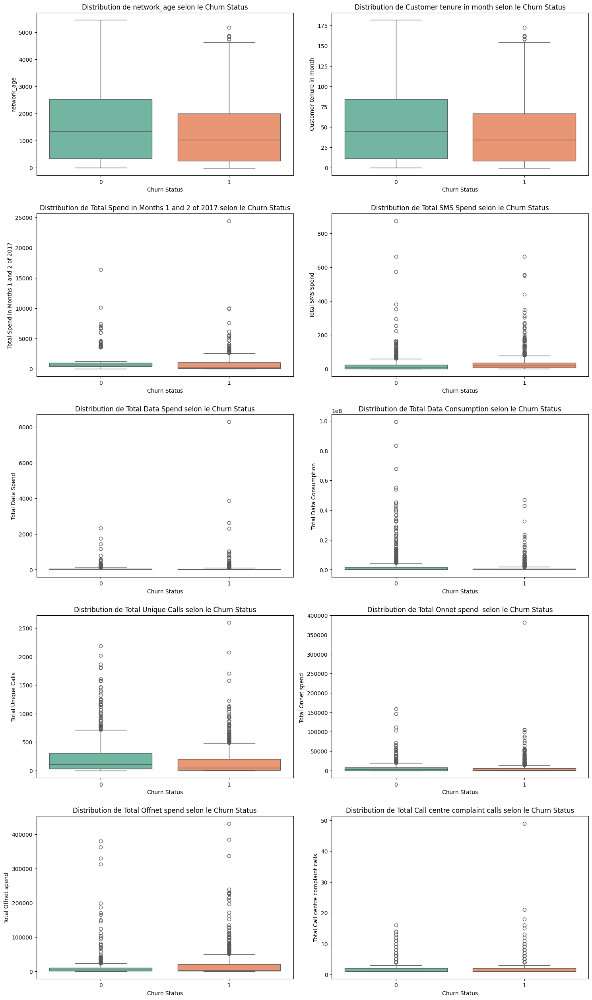

In [ ]:
quant_vars = nig.select_dtypes(include='number').columns
quant_vars = [var for var in quant_vars if var != 'Churn Status']
plt.figure(figsize=(15, 5 * len(quant_vars)))

for i, var in enumerate(quant_vars):
    plt.subplot(len(quant_vars), 2, i + 1)
    sns.boxplot(data=nig, x='Churn Status', y=var, palette='Set2')
    plt.title(f"Distribution de {var} selon le Churn Status")
    plt.xlabel("Churn Status")
    plt.ylabel(var)

plt.tight_layout()
plt.show()

Interprétation 

## Valeurs manquantes

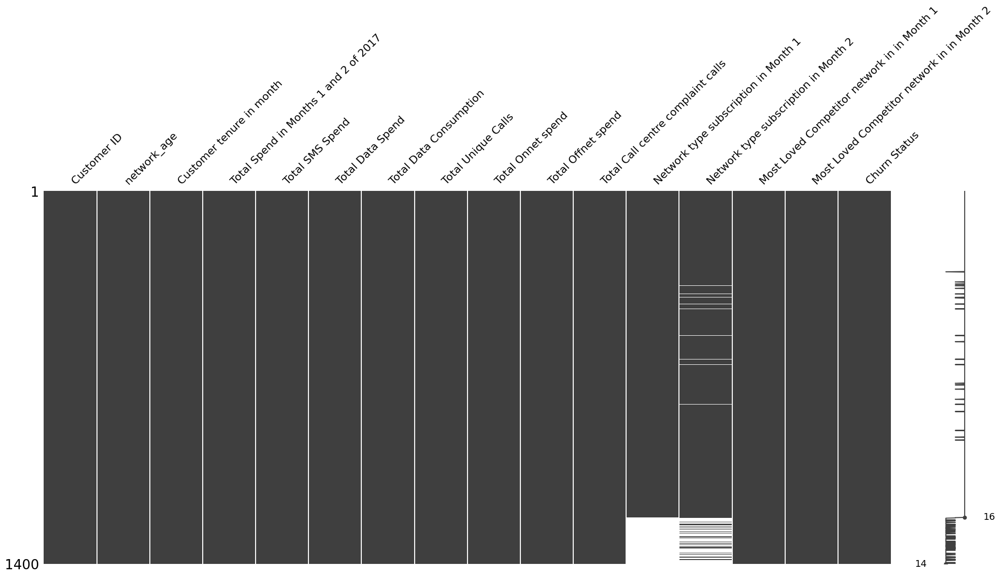

In [22]:
import missingno as msno
import matplotlib.pyplot as plt

# Affichage du graphique des valeurs manquantes
msno.matrix(nig)
plt.show()


In [ ]:
# Affichage du nombre de valeurs manquantes par variable 
pd.DataFrame(nig.isnull().sum()).T

,Customer ID,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2,Churn Status
0,0,0,0,0,0,0,0,0,0,0,0,175,144,1,1,0


In [ ]:
lignes_na = nig[nig.isna().any(axis=1)]
display(lignes_na)

,Customer ID,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2,Churn Status
303,ADF2000,2308,76.93,481.9000,0.00,125.00,6.205152e+05,3,0,609,1,2G,2G,NaN,NaN,0
341,ADF0125,473,15.77,1229.6324,37.08,75.00,5.429410e+06,537,16344,51046,1,3G,NaN,Weematel,Mango,1
349,ADF0138,214,7.13,4673.5620,181.14,1043.75,3.111038e+06,144,51846,151965,4,3G,NaN,ToCall,Mango,1
355,ADF0268,1407,46.90,154.7092,0.00,17.50,3.651085e+07,10,275,1601,1,3G,NaN,Zintel,PQza,0
365,ADF0288,1448,48.27,309.8880,0.00,91.25,6.646839e+06,11,0,2430,1,3G,NaN,Mango,PQza,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,ADF1956,136,4.53,270.3344,6.58,2.50,7.410753e+03,62,9504,10820,1,NaN,NaN,PQza,Zintel,0
1396,ADF1965,1795,59.83,1024.8460,111.99,10.00,4.936720e+05,149,18202,40730,2,NaN,NaN,Mango,Zintel,0
1397,ADF1967,203,6.77,1143.4972,19.84,13.75,2.619307e+02,284,360,81341,3,NaN,NaN,Zintel,Zintel,0
1398,ADF1971,109,3.63,45.0900,0.00,0.00,6.581623e+05,20,240,3611,1,NaN,3G,Uxaa,Zintel,1


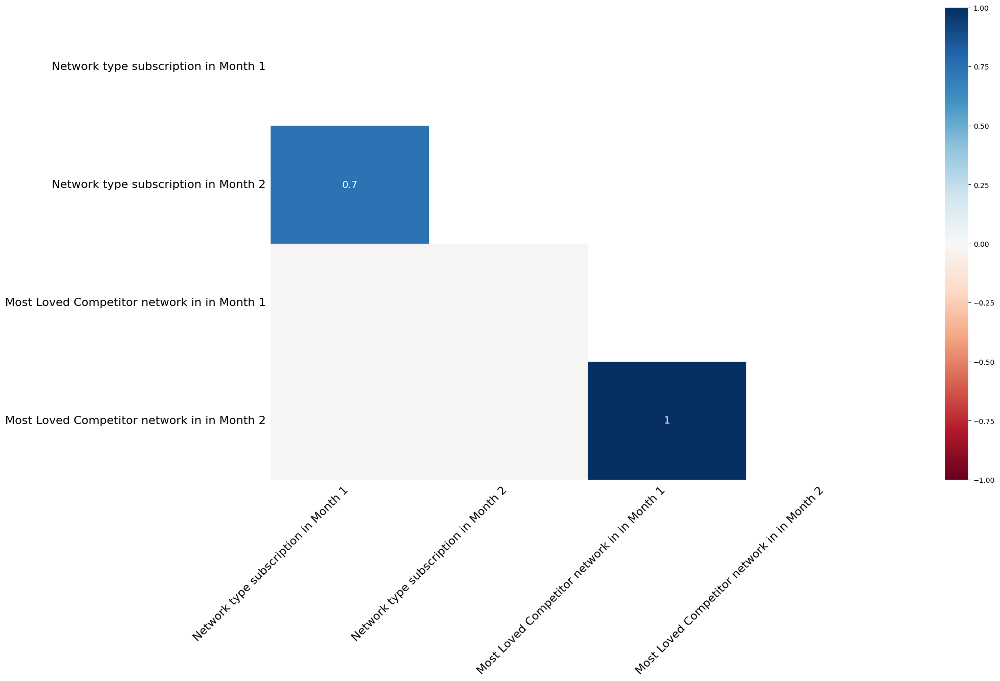

In [26]:
#corrélation entre les données manquantes 
msno.heatmap(nig)
plt.show()

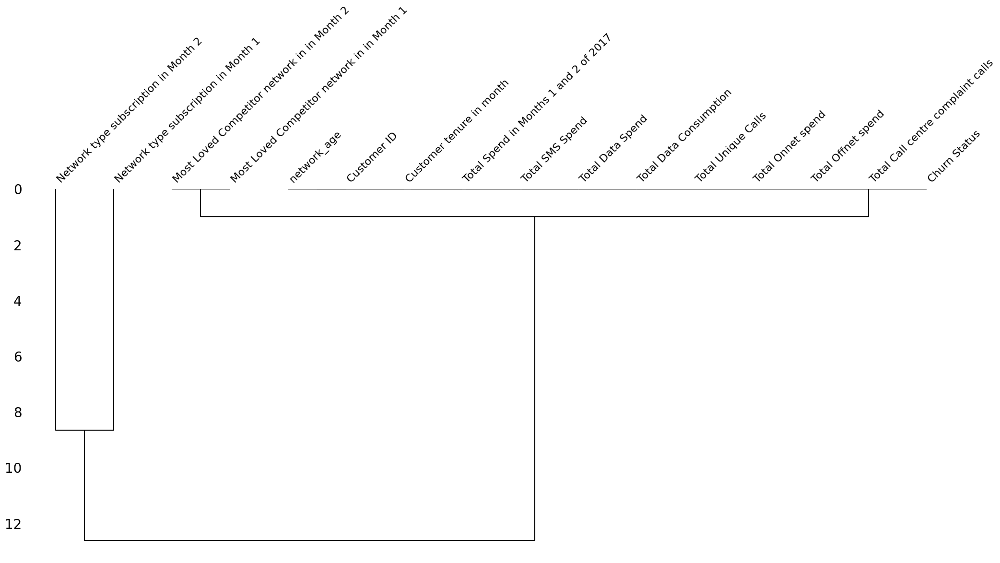

In [23]:
# Analyser la corrélation entre les valeurs manquantes
msno.dendrogram(nig)
plt.show()

In [27]:
# Tableau des valeurs manquantes par colonne
missing_values = nig.isnull().sum()
missing_percent = (missing_values / len(nig)) * 100
missing_table = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percent})
print(missing_table)

                                             Missing Values  Percentage
Customer ID                                               0    0.000000
network_age                                               0    0.000000
Customer tenure in month                                  0    0.000000
Total Spend in Months 1 and 2 of 2017                     0    0.000000
Total SMS Spend                                           0    0.000000
Total Data Spend                                          0    0.000000
Total Data Consumption                                    0    0.000000
Total Unique Calls                                        0    0.000000
Total Onnet spend                                         0    0.000000
Total Offnet spend                                        0    0.000000
Total Call centre complaint calls                         0    0.000000
Network type subscription in Month 1                    175   12.500000
Network type subscription in Month 2                    144   10

Les pourcentages de valeurs manquantes sont faibles (30%). Nous n'allons pas supprimer ces variables mais procéder à des imputations.

## Valeurs aberrantes

Observons les lignes où network_age et Customer tenure in month ont des valeurs négatives.

In [105]:
from IPython.display import display

# Filtrer les lignes où les deux colonnes sont >= 0
filtered_rows = nig[(nig["network_age"] <= 0) & (nig["Customer tenure in month"] <= 0)]

# Afficher le tableau des lignes correspondantes
display(filtered_rows)

,Customer ID,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2,Churn Status
490,ADF0631,-5,-0.17,857.1008,63.47,190.03,1.565901e+06,204,716,1240,1,3G,3G,ToCall,ToCall,1
916,ADF1925,-4,-0.13,2898.8240,25.10,1.25,3.058533e+05,642,0,82221,1,3G,3G,Mango,Weematel,1
1163,ADF1623,-2,-0.07,130.5780,94.85,1.25,2.195300e+00,7,150,1121,1,Other,Other,Uxaa,Uxaa,1


Il semblerait que sur la ligne 1163 ce soit une erreur de signe (et donc 2 jours sur le réseau au lieu de -2) car l'individu n'affiche pas de grandes dépenses et a une faible consommation en données. Il n'a par ailleurs passé que 7 appels. 

Les données des individus 490 et 916 semblent moins cohérentes et ne laissent en rien penser à une erreur de signe. Par exemple, l'individu 490 aurait consommé 1,565,901 Kbs de données en 5 jours ; pourtant l'individu 4 (voir nig.head()) a consommé 673,204.0342 Kbs en 2175 jours. L'on pourrait expliquer cela par une forte consommation en data de celui-ci (individu 490) mais nous n'avons pas suffisamment de preuves pour l'affirmer.

### Histogrammes et boxplots des variables quantitatives

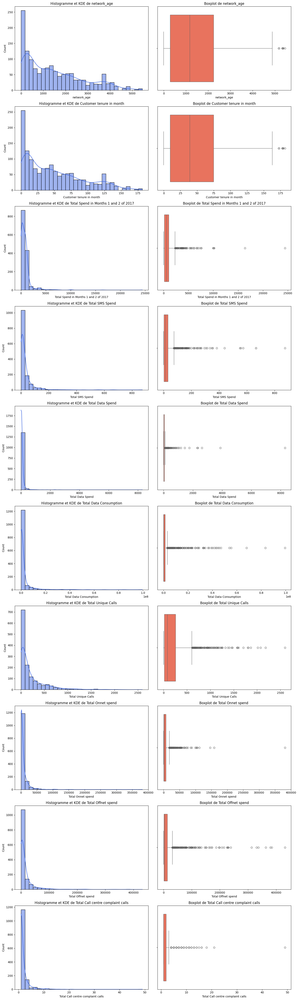

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sélectionner uniquement les variables quantitatives
quantitative_vars = nig.select_dtypes(include=['number']).columns 
quantitative_vars = [var for var in quantitative_vars if var != 'Churn Status']

# Définir la taille de la figure
plt.figure(figsize=(15, 5 * len(quantitative_vars)))

for i, var in enumerate(quantitative_vars):
    plt.subplot(len(quantitative_vars), 2, 2*i + 1)
    sns.histplot(nig[var], kde=True, bins=30, color='royalblue')
    plt.title(f"Histogramme et KDE de {var}")

    plt.subplot(len(quantitative_vars), 2, 2*i + 2)
    sns.boxplot(x=nig[var], color='tomato')
    plt.title(f"Boxplot de {var}")

plt.tight_layout()
plt.show()


In [107]:
df1=nig.copy()
#Création des nouvelles variables
df1["SMS_Spend_Ratio"] = df1["Total SMS Spend"] / df1["Total Spend in Months 1 and 2 of 2017"]
df1["Data_Spend_Ratio"] = df1["Total Data Spend"] / df1["Total Spend in Months 1 and 2 of 2017"]
df1["Onnet_Spend_Ratio"] = df1["Total Onnet spend "] / df1["Total Spend in Months 1 and 2 of 2017"]
df1["Offnet_Spend_Ratio"] = df1["Total Offnet spend"] / df1["Total Spend in Months 1 and 2 of 2017"]

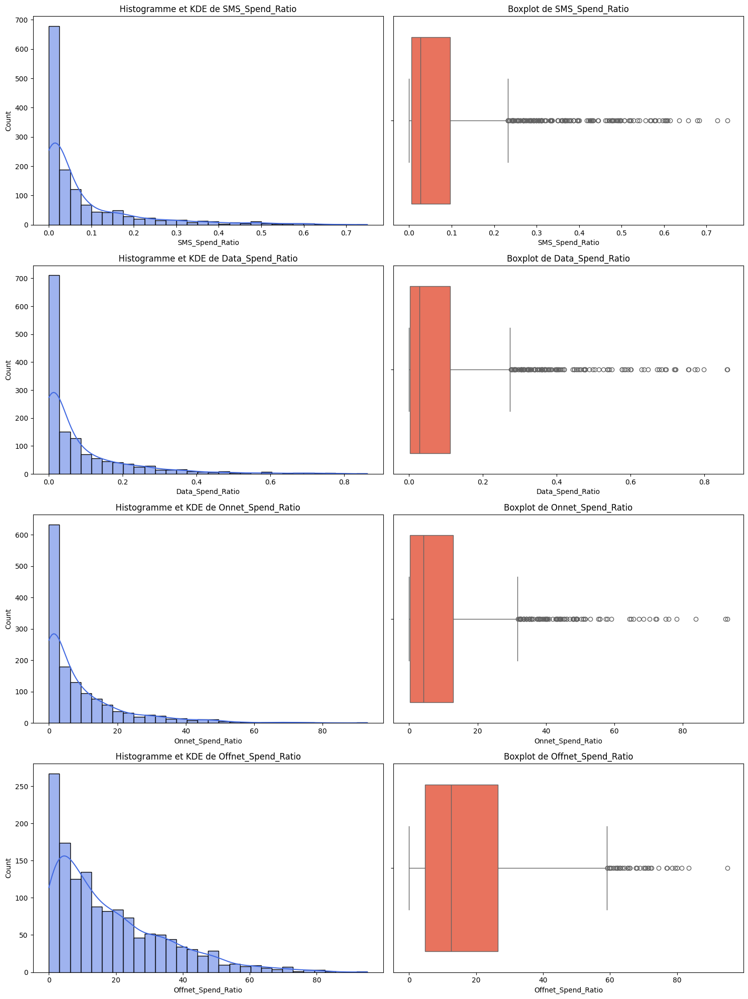

In [108]:
#Histogrammes et boxplots des ratios
import seaborn as sns
import matplotlib.pyplot as plt
# Variables à examiner
ratios = ['SMS_Spend_Ratio', 'Data_Spend_Ratio', 'Onnet_Spend_Ratio', 'Offnet_Spend_Ratio']
# Définir la taille de la figure
plt.figure(figsize=(15, 5 * len(ratios)))
for i, var in enumerate(ratios):
    plt.subplot(len(ratios), 2, 2*i + 1)
    sns.histplot(df1[var], kde=True, bins=30, color='royalblue')
    plt.title(f"Histogramme et KDE de {var}")

    plt.subplot(len(ratios), 2, 2*i + 2)
    sns.boxplot(x=df1[var], color='tomato')
    plt.title(f"Boxplot de {var}")

plt.tight_layout()
plt.show()


### Méthode IQR

In [109]:
# Identification des données aberrantes - IQR
# Fonction pour détecter les outliers en utilisant l'IQR
def detect_outliers_iqr (data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] < lower_bound) | (data[column] > upper_bound)]

# Trouver les outliers 
#outliers = detect_outliers_iqr(df1, 'SMS_Spend_Ratio')

# Afficher les outliers
#print("Outliers détectés:")
#pd.DataFrame(outliers)

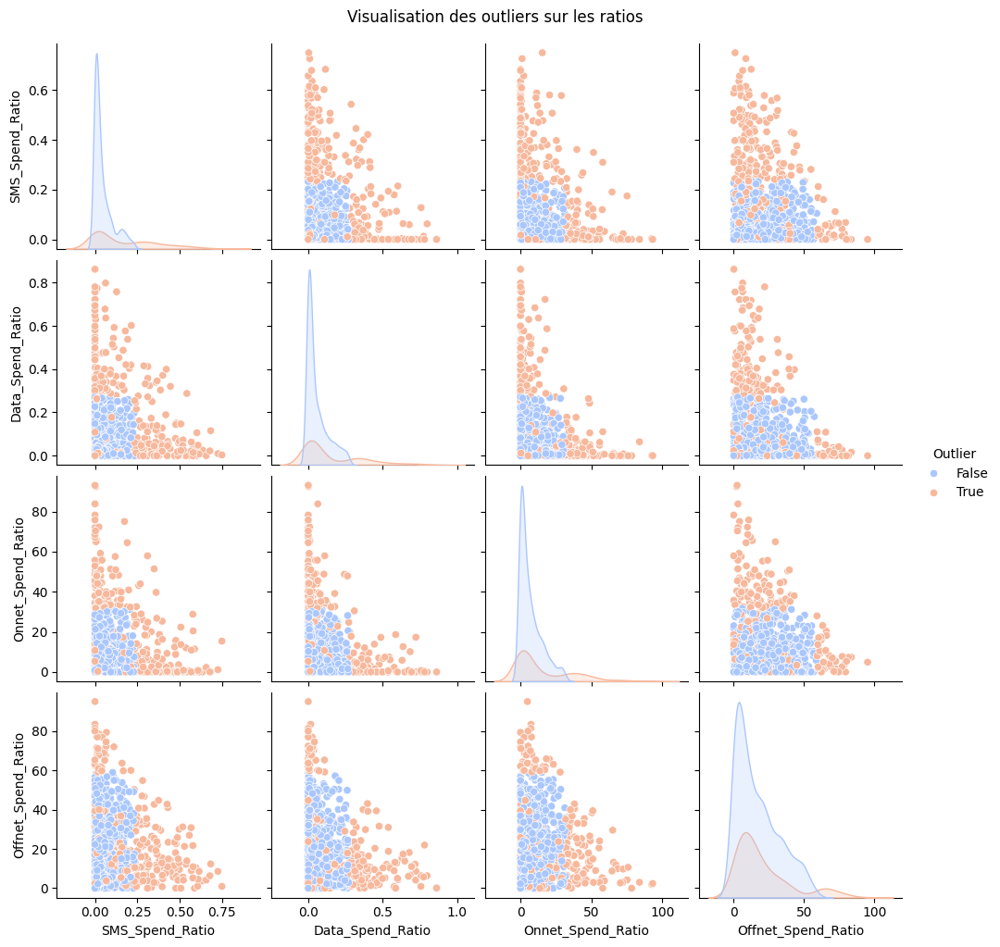

In [110]:
import matplotlib.pyplot as plt
import seaborn as sns

# Initialiser la colonne 'Outlier' à False
df1['Outlier'] = False

# Variables à examiner
ratios = ['SMS_Spend_Ratio', 'Data_Spend_Ratio', 'Onnet_Spend_Ratio', 'Offnet_Spend_Ratio']

# Détecter et marquer les outliers pour chaque variable
for var in ratios:
    outliers_var = detect_outliers_iqr(df1, var)
    df1.loc[outliers_var.index, 'Outlier'] = True

# Visualiser les relations entre paires avec les outliers en couleur
sns.pairplot(df1[ratios + ['Outlier']], hue='Outlier', palette='coolwarm')
plt.suptitle("Visualisation des outliers sur les ratios", y=1.02)
plt.show()

# Feature engineering

## Variables qualitatives

In [55]:
df1=nig.copy()

In [56]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin


# --- VARIABLES CATÉGORIELLES ---
cat_features = ['Network type subscription in Month 1', 
                'Network type subscription in Month 2', 
                'Most Loved Competitor network in in Month 1', 
                'Most Loved Competitor network in in Month 2']

class CustomCategoricalImputer(BaseEstimator, TransformerMixin):
    """Classe pour gérer l'imputation spécifique des variables catégorielles."""
    def fit(self, X, y=None):
        self.most_frequent_1 = X['Network type subscription in Month 1'].mode()[0]
        self.most_frequent_2 = X['Network type subscription in Month 2'].mode()[0]
        self.most_frequent_comp_1 = X['Most Loved Competitor network in in Month 1'].mode()[0]
        self.most_frequent_comp_2 = X['Most Loved Competitor network in in Month 2'].mode()[0]
        return self

    def transform(self, X):
        X = X.copy()
        
        # Remplacer les "0" et NA par "Aucun"
        for col in ['Most Loved Competitor network in in Month 1', 'Most Loved Competitor network in in Month 2']:
            X[col].replace('0', 'Aucun', inplace=True)
            X[col].fillna('Aucun', inplace=True)

        # Compléter les NA de Network type subscription
        mask1 = X['Network type subscription in Month 1'].isna() & X['Network type subscription in Month 2'].notna()
        mask2 = X['Network type subscription in Month 2'].isna() & X['Network type subscription in Month 1'].notna()
        X.loc[mask1, 'Network type subscription in Month 1'] = X.loc[mask1, 'Network type subscription in Month 2']
        X.loc[mask2, 'Network type subscription in Month 2'] = X.loc[mask2, 'Network type subscription in Month 1']
        
        # Imputation des valeurs manquantes restantes
        X['Network type subscription in Month 1'].fillna(self.most_frequent_1, inplace=True)
        X['Network type subscription in Month 2'].fillna(self.most_frequent_2, inplace=True)
        X['Most Loved Competitor network in in Month 1'].fillna(self.most_frequent_comp_1, inplace=True)
        X['Most Loved Competitor network in in Month 2'].fillna(self.most_frequent_comp_2, inplace=True)

        return X

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    """Encode les variables catégorielles selon leur fréquence."""
    def fit(self, X, y=None):
        self.freq_maps = {col: X[col].value_counts(normalize=True).to_dict() for col in cat_features}
        return self

    def transform(self, X):
        X = X.copy()
        for col in cat_features:
            X[col] = X[col].map(self.freq_maps[col])
        return X

# Pipeline catégoriel
cat_pipeline = Pipeline([
    ('imputer', CustomCategoricalImputer()),
    ('freq_encoder', FrequencyEncoder())
])

# Transformation des données et modification directement dans df1
df1[cat_features] = cat_pipeline.fit_transform(df1[cat_features])

# Afficher le résultat
df1.head()


C:\Users\DELL\AppData\Local\Temp\ipykernel_17848\2677908274.py:26: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].replace('0', 'Aucun', inplace=True)
C:\Users\DELL\AppData\Local\Temp\ipykernel_17848\2677908274.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, 

,Customer ID,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2,Churn Status
0,ADF0039,123,4.10,76.7140,0.00,1.25,1.4951,14,564,6408,2,0.217143,0.202857,0.231429,0.072143,0
1,ADF0041,1316,43.87,98.8904,4.14,1.25,1.0244,27,1626,4373,1,0.217143,0.202857,0.231429,0.072143,0
2,ADF0051,2385,79.50,372.6300,3.51,1.25,6.0898,119,10411,22039,1,0.217143,0.202857,0.099286,0.072143,0
3,ADF0059,1614,53.80,530.2000,6.85,1.25,3.3447,69,6822,6274,1,0.217143,0.202857,0.027857,0.072143,0
4,ADF0060,2175,72.50,554.1300,6.99,153.75,673204.0342,33,3387,7241,1,0.217143,0.593571,0.099286,0.072143,0


In [74]:
pd.DataFrame(df1.isnull().sum()).T

,Customer ID,network_age,Customer tenure in month,Total Spend in Months 1 and 2 of 2017,Total SMS Spend,Total Data Spend,Total Data Consumption,Total Unique Calls,Total Onnet spend,Total Offnet spend,Total Call centre complaint calls,Network type subscription in Month 1,Network type subscription in Month 2,Most Loved Competitor network in in Month 1,Most Loved Competitor network in in Month 2,Churn Status,SMS_Spend_Ratio,Data_Spend_Ratio,Onnet_Spend_Ratio,Offnet_Spend_Ratio
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## Variables quantitatives

Les données quantitatives ne comportent pas de valeurs manquantes. Nous allons donc nous focaliser sur les données aberrantes.

In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np

# Étape 1 : suppression des espaces dans les noms de colonnes
class CleanColumnNames(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X.columns = X.columns.str.replace(" ", "")
        return X

# Étape 2 : rendre les valeurs de ADF1623 positives
class FixADF1623(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.copy()
        mask = X["CustomerID"] == "ADF1623"
        for col in ["network_age", "Customertenureinmonth"]:
            if col in X.columns:
                X.loc[mask, col] = X.loc[mask, col].abs()
        return X

# Étape 3 : supprimer les individus sauf ADF1623 ayant un network_age négatif
class RemoveNegNetworkAgeExceptADF1623(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.copy()
        return X[(X["CustomerID"] == "ADF1623") | (X["network_age"] >= 0)]

# Étape 4 : création des ratios
class CreateRatios(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.copy()
        base = "TotalSpendinMonths1and2of2017"
        variables = [
            "TotalSMSSpend", 
            "TotalDataSpend", 
            "TotalUniqueCalls", 
            "TotalOnnetspend", 
            "TotalOffnetspend"
        ]
        for var in variables:
            if var in X.columns:
                X[f"{var}_ratio"] = X[var] / X[base].replace(0, np.nan)
        # Suppression des colonnes
        variables_a_supprimer = variables + [base]
        X.drop(columns=variables_a_supprimer, inplace=True, errors='ignore')
        return X

# Étape 5 : scaling
class ScaleQuantVars(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.scaler = MinMaxScaler()
    def fit(self, X, y=None):
        self.columns = X.select_dtypes(include=[np.number]).columns.difference(["ChurnStatus"])
        self.scaler.fit(X[self.columns])
        return self
    def transform(self, X):
        X = X.copy()
        X[self.columns] = self.scaler.transform(X[self.columns])
        return X

# Pipeline final
quant_pipeline = Pipeline([
    ("clean_columns", CleanColumnNames()),
    ("fix_adf1623", FixADF1623()),
    ("remove_neg_network_age", RemoveNegNetworkAgeExceptADF1623()),  
    ("create_ratios", CreateRatios()),
    ("scale_vars", ScaleQuantVars())
])

# Application
df_transformed = quant_pipeline.fit_transform(df1)
df_transformed.head()


,CustomerID,network_age,Customertenureinmonth,TotalDataConsumption,TotalCallcentrecomplaintcalls,NetworktypesubscriptioninMonth1,NetworktypesubscriptioninMonth2,MostLovedCompetitornetworkininMonth1,MostLovedCompetitornetworkininMonth2,ChurnStatus,TotalSMSSpend_ratio,TotalDataSpend_ratio,TotalUniqueCalls_ratio,TotalOnnetspend_ratio,TotalOffnetspend_ratio
0,ADF0039,0.022206,0.022188,1.444351e-08,0.020833,0.036122,0.0,0.946844,0.120773,0,0.000000,0.018893,0.043070,0.078978,0.878239
1,ADF0041,0.241145,0.241150,9.710788e-09,0.000000,0.036122,0.0,0.946844,0.120773,0,0.055832,0.014656,0.064867,0.176631,0.464933
2,ADF0051,0.437328,0.437318,6.064165e-08,0.000000,0.036122,0.0,0.332226,0.120773,0,0.012562,0.003889,0.076019,0.300134,0.621840
3,ADF0059,0.295834,0.295821,3.304061e-08,0.000000,0.036122,0.0,0.000000,0.120773,0,0.017230,0.002734,0.030465,0.138220,0.124414
4,ADF0060,0.398789,0.398778,6.768835e-03,0.000000,0.036122,1.0,0.332226,0.120773,0,0.016823,0.321708,0.013470,0.065660,0.137389


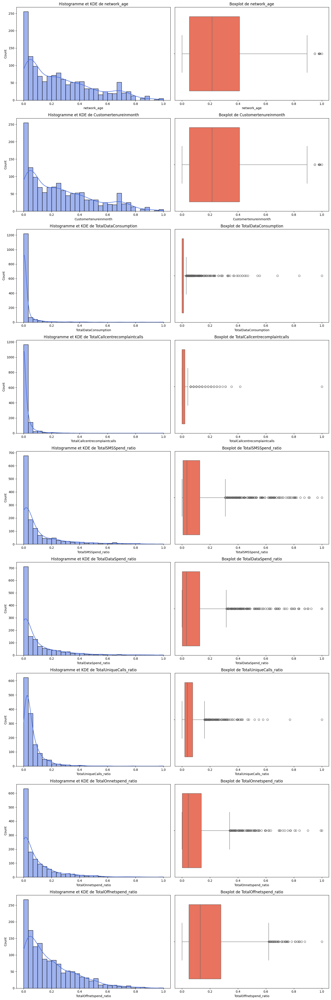

In [40]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sélectionner uniquement les variables quantitatives
quantitative_vars = df_transformed.select_dtypes(include=['number']).columns 
quantitative_vars = [var for var in quantitative_vars if var != 'ChurnStatus']

# Définir la taille de la figure
plt.figure(figsize=(15, 5 * len(quantitative_vars)))

for i, var in enumerate(quantitative_vars):
    plt.subplot(len(quantitative_vars), 2, 2*i + 1)
    sns.histplot(df_transformed[var], kde=True, bins=30, color='royalblue')
    plt.title(f"Histogramme et KDE de {var}")

    plt.subplot(len(quantitative_vars), 2, 2*i + 2)
    sns.boxplot(x=df_transformed[var], color='tomato')
    plt.title(f"Boxplot de {var}")

plt.tight_layout()
plt.show()


## Pipeline général

In [60]:
df1=nig.copy()

In [ ]:
# ------------------------------
# 1. Pipeline catégoriel 
# ------------------------------

cat_features = ['NetworktypesubscriptioninMonth1', 
                'NetworktypesubscriptioninMonth2', 
                'MostLovedCompetitornetworkininMonth1', 
                'MostLovedCompetitornetworkininMonth2']

class CustomCategoricalImputer(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.most_frequent_1 = X[cat_features[0]].mode()[0]
        self.most_frequent_2 = X[cat_features[1]].mode()[0]
        self.most_frequent_comp_1 = X[cat_features[2]].mode()[0]
        self.most_frequent_comp_2 = X[cat_features[3]].mode()[0]
        return self

    def transform(self, X):
        X = X.copy()
        for col in cat_features[2:]:
            X[col].replace('0', 'Aucun', inplace=True)
            X[col].fillna('Aucun', inplace=True)

        mask1 = X[cat_features[0]].isna() & X[cat_features[1]].notna()
        mask2 = X[cat_features[1]].isna() & X[cat_features[0]].notna()
        X.loc[mask1, cat_features[0]] = X.loc[mask1, cat_features[1]]
        X.loc[mask2, cat_features[1]] = X.loc[mask2, cat_features[0]]

        X[cat_features[0]].fillna(self.most_frequent_1, inplace=True)
        X[cat_features[1]].fillna(self.most_frequent_2, inplace=True)
        X[cat_features[2]].fillna(self.most_frequent_comp_1, inplace=True)
        X[cat_features[3]].fillna(self.most_frequent_comp_2, inplace=True)
        return X

class FrequencyEncoder(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        self.freq_maps = {col: X[col].value_counts(normalize=True).to_dict() for col in cat_features}
        return self

    def transform(self, X):
        X = X.copy()
        for col in cat_features:
            X[col] = X[col].map(self.freq_maps[col])
        return X

# ------------------------------
# 2. Pipeline quantitatif
# ------------------------------

class CleanColumnNames(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X.columns = X.columns.str.replace(" ", "")
        return X

class FixADF1623(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.copy()
        mask = X["CustomerID"] == "ADF1623"
        for col in ["network_age", "Customertenureinmonth"]:
            if col in X.columns:
                X.loc[mask, col] = X.loc[mask, col].abs()
        return X

class RemoveNegNetworkAgeExceptADF1623(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[(X["CustomerID"] == "ADF1623") | (X["network_age"] >= 0)].copy()

class CreateRatios(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        X = X.copy()
        base = "TotalSpendinMonths1and2of2017"
        variables = [
            "TotalSMSSpend", 
            "TotalDataSpend", 
            "TotalUniqueCalls", 
            "TotalOnnetspend", 
            "TotalOffnetspend"
        ]
        for var in variables:
            if var in X.columns:
                X[f"{var}_ratio"] = X[var] / X[base].replace(0, np.nan)
        X.drop(columns=variables + [base], inplace=True, errors='ignore')
        return X

class ScaleQuantVars(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.scaler = MinMaxScaler()
    def fit(self, X, y=None):
        self.columns = X.select_dtypes(include=[np.number]).columns.difference(["ChurnStatus"])
        self.scaler.fit(X[self.columns])
        return self
    def transform(self, X):
        X = X.copy()
        X[self.columns] = self.scaler.transform(X[self.columns])
        return X

# ------------------------------
# 3. Full Preprocessing Pipeline
# ------------------------------

class FullPreprocessingPipeline(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.cat_pipeline = Pipeline([
            ('imputer', CustomCategoricalImputer()),
            ('freq_encoder', FrequencyEncoder())
        ])
        self.quant_pipeline = Pipeline([
            ("clean_columns", CleanColumnNames()),
            ("fix_adf1623", FixADF1623()),
            ("remove_neg_network_age", RemoveNegNetworkAgeExceptADF1623()),
            ("create_ratios", CreateRatios()),
            ("scale_vars", ScaleQuantVars())
        ])

    def fit(self, X, y=None):
        # Appliquer pipeline quanti pour nettoyage colonnes + suppression lignes
        X_clean = self.quant_pipeline.fit_transform(X.copy())
        self.cat_pipeline.fit(X_clean[cat_features])
        return self

    def transform(self, X):
        X = self.quant_pipeline.transform(X.copy())
        X_cat = self.cat_pipeline.transform(X[cat_features])
        X[cat_features] = X_cat
        return X

# ------------------------------
# Utilisation
# ------------------------------

pipeline = FullPreprocessingPipeline()
df_final = pipeline.fit_transform(df1)
df_final.head()


C:\Users\DELL\AppData\Local\Temp\ipykernel_17848\1422882567.py:27: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  X[col].replace('0', 'Aucun', inplace=True)
C:\Users\DELL\AppData\Local\Temp\ipykernel_17848\1422882567.py:28: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, 

,CustomerID,network_age,Customertenureinmonth,TotalDataConsumption,TotalCallcentrecomplaintcalls,NetworktypesubscriptioninMonth1,NetworktypesubscriptioninMonth2,MostLovedCompetitornetworkininMonth1,MostLovedCompetitornetworkininMonth2,ChurnStatus,TotalSMSSpend_ratio,TotalDataSpend_ratio,TotalUniqueCalls_ratio,TotalOnnetspend_ratio,TotalOffnetspend_ratio
0,ADF0039,0.022206,0.022188,1.444351e-08,0.020833,0.217454,0.203147,0.231760,0.072246,0,0.000000,0.018893,0.043070,0.078978,0.878239
1,ADF0041,0.241145,0.241150,9.710788e-09,0.000000,0.217454,0.203147,0.231760,0.072246,0,0.055832,0.014656,0.064867,0.176631,0.464933
2,ADF0051,0.437328,0.437318,6.064165e-08,0.000000,0.217454,0.203147,0.099428,0.072246,0,0.012562,0.003889,0.076019,0.300134,0.621840
3,ADF0059,0.295834,0.295821,3.304061e-08,0.000000,0.217454,0.203147,0.027897,0.072246,0,0.017230,0.002734,0.030465,0.138220,0.124414
4,ADF0060,0.398789,0.398778,6.768835e-03,0.000000,0.217454,0.592990,0.099428,0.072246,0,0.016823,0.321708,0.013470,0.065660,0.137389


In [ ]:

# Sauvegarde
joblib.dump(pipeline, 'Pipeline_final.joblib')

['Pipeline_final.joblib']